---
title: Results (Julia)
---

In [1]:
using DrWatson
@quickactivate
include(srcdir("main.jl"));

In [56]:
wind_df = load_wind();
jno_df = load_jno();

In [ ]:
j_events_taus = load_taus(60:-10:20)

# find the numbers of events for each tau
combine(groupby(j_events_taus, :tau), nrow)

## Check the discontinuities properties with time and radial distance

In [19]:
maps1 = [l_log_map l_norm_log_map j_log_map j_norm_log_map]
maps2 = [density_log_map B_log_map beta_map b_log_map];

In [49]:
temp_plot(layer::Layer) = m -> plot_dist(layer, m; datalimits=datalimits_f)
temp_plot(df::DataFrame; color = year_map) = temp_plot(data(df) * mapping(color=color))

temp_plot (generic function with 3 methods)

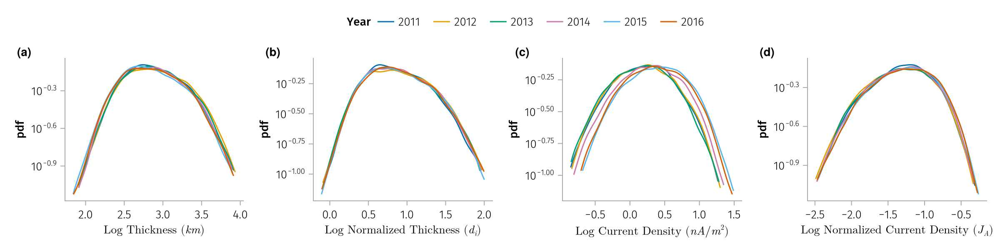

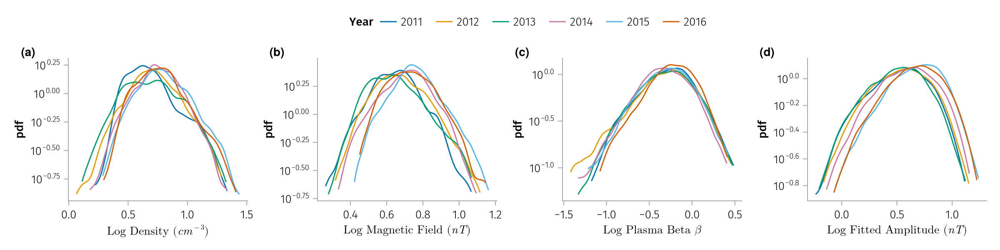

┌ Info: File /Users/zijin/projects/ids_spatial_evolution_juno/figures/wind_distribution_time.svg already exists. Skipping...
└ @ Beforerr /Users/zijin/.julia/dev/Beforerr/src/utils/makie.jl:45
┌ Info: File /Users/zijin/projects/ids_spatial_evolution_juno/figures/sw_paramters.svg already exists. Skipping...
└ @ Beforerr /Users/zijin/.julia/dev/Beforerr/src/utils/makie.jl:45


In [51]:
fs = temp_plot(wind_df).([maps1, maps2])
fnames = ["wind_distribution_time", "sw_paramters"]
easy_save.(fnames, fs)
display.(fs);

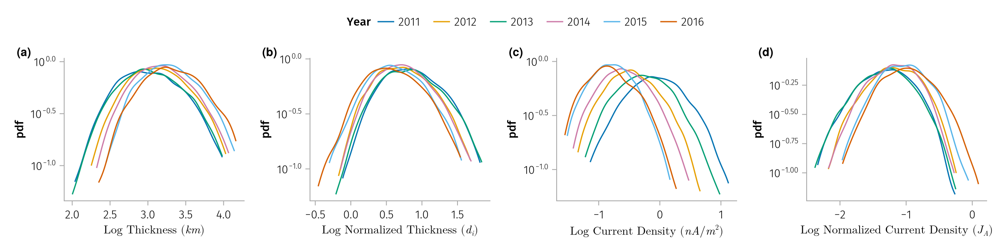

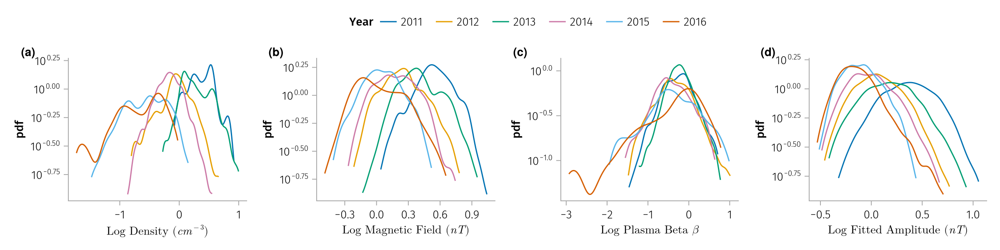

In [52]:
fs = temp_plot(jno_df).([maps1, maps2])
display.(fs);

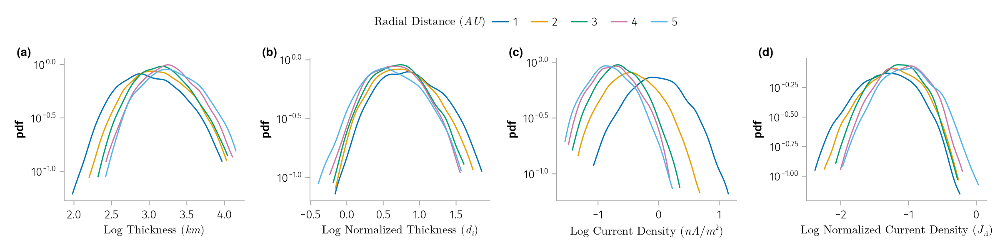

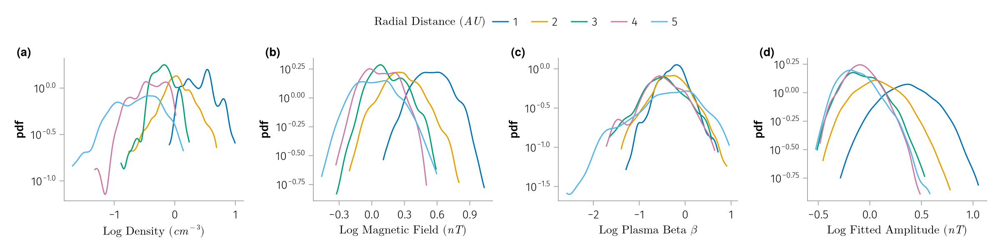

In [53]:
fs = temp_plot(jno_df; color= r_map).([maps1, maps2])
display.(fs);

┌ Info: Saved /Users/zijin/projects/ids_spatial_evolution_juno/figures/juno_distribution_r.png
└ @ beforerr /Users/zijin/.julia/dev/beforerr.jl/src/utils/makie.jl:34


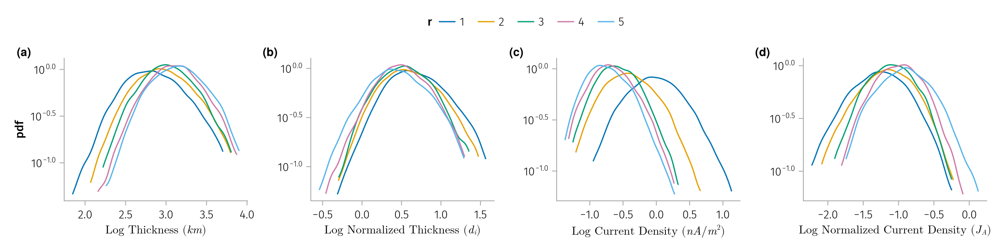

In [46]:
plot_dist(
    data(j_events_taus) * mapping(color=:r);
    datalimits=datalimits_f,
)
easy_save("juno_distribution_r")

### The effect of tau

┌ Info: Saved /Users/zijin/projects/ids_spatial_evolution_juno/notebooks/figures/juno_distribution_r_taus.png
└ @ beforerr /Users/zijin/.julia/dev/beforerr.jl/src/utils/makie.jl:34


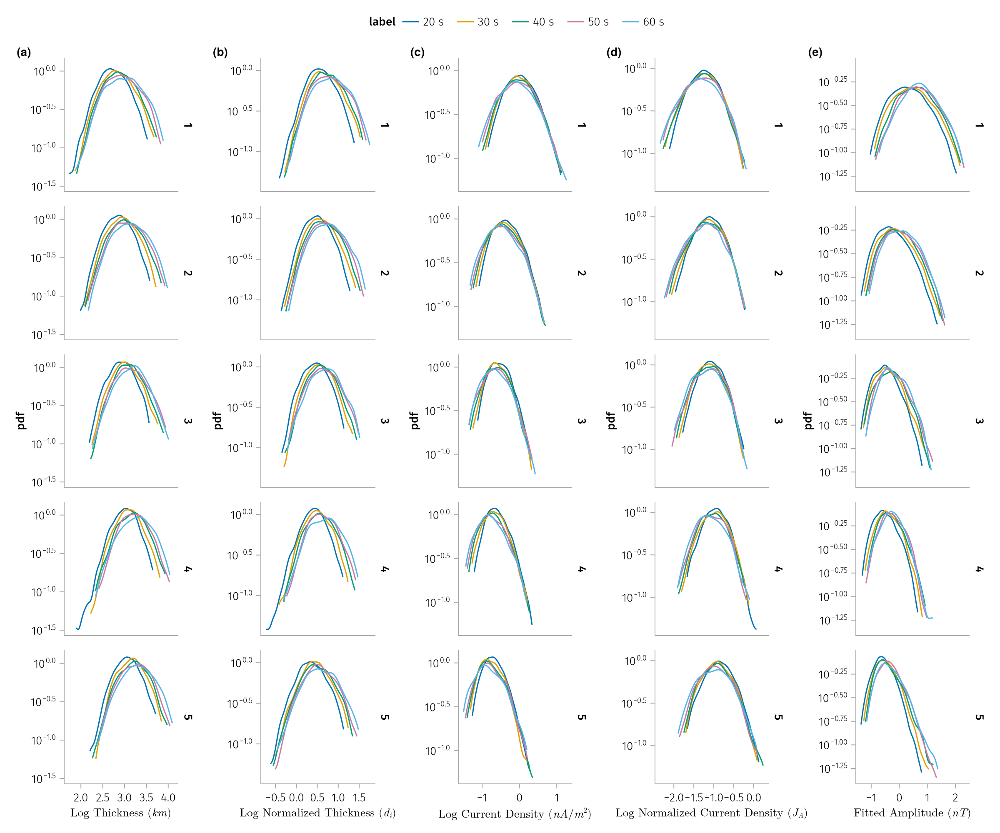

In [26]:
plot_dist(
    data(j_events_taus_unique) * mapping(color=:label, row = :r);
    maps=(l_log_map, l_norm_log_map, j_log_map, j_norm_log_map, b_log_map,),
    datalimits=datalimits_f,
    figure_kwargs=(size=(1200, 1000),)
)

easy_save("juno_distribution_r_taus")

## Durations

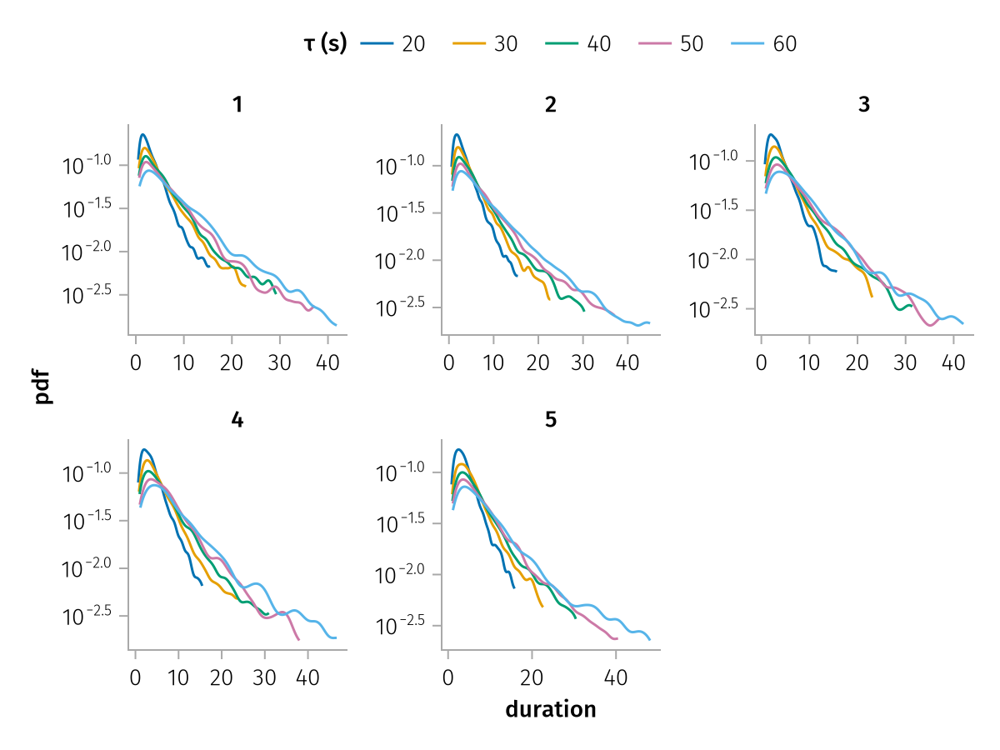

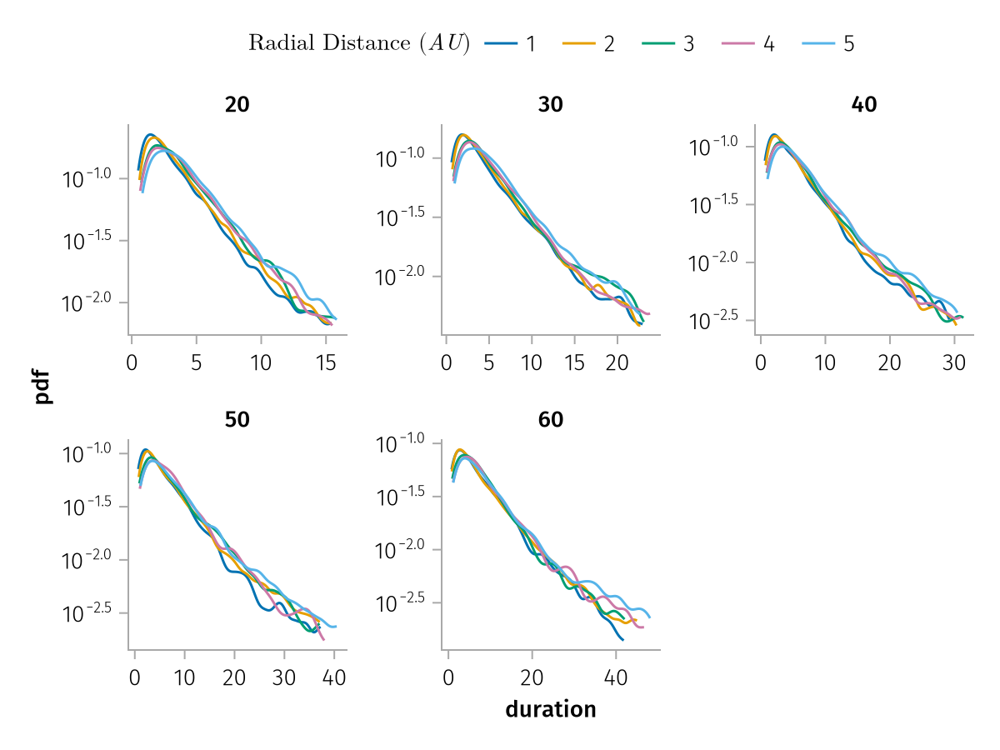

In [13]:
p1 = plot_duration(
    data(j_events_taus) * mapping(color=tau_map, layout=r_map)
)
p2 = plot_duration(
    data(j_events_taus) * mapping(color=r_map, layout=tau_map),
)

display.([p1 p2]);

## Archived (Following codes may not work)

In [37]:
j_events_low_fit = load()
j_events_tau_20_fit = load(tau = 20)
j_events_high_fit = load(ts = 0.12)

# add a label column to the dataframes
j_events_low_fit.label .= "1 Hz (fit)"
j_events_high_fit.label .= "8 Hz (fit)"
j_events_tau_20_fit.label .= "1 Hz, 20s (fit)"
j_events = reduce(vcat, [j_events_low_fit, j_events_high_fit, j_events_tau_20_fit]) |> process;

In [51]:
# NOTE: log axis for density is not working now
function plot_l_j_r(df)
    data_layer = data(df) * mapping(row=:r, color=:label)
    plot_dist(data_layer; datalimits=datalimits_f, figure_kwargs=(size=(1200, 1200),))
end

plot_l_j_r (generic function with 1 method)

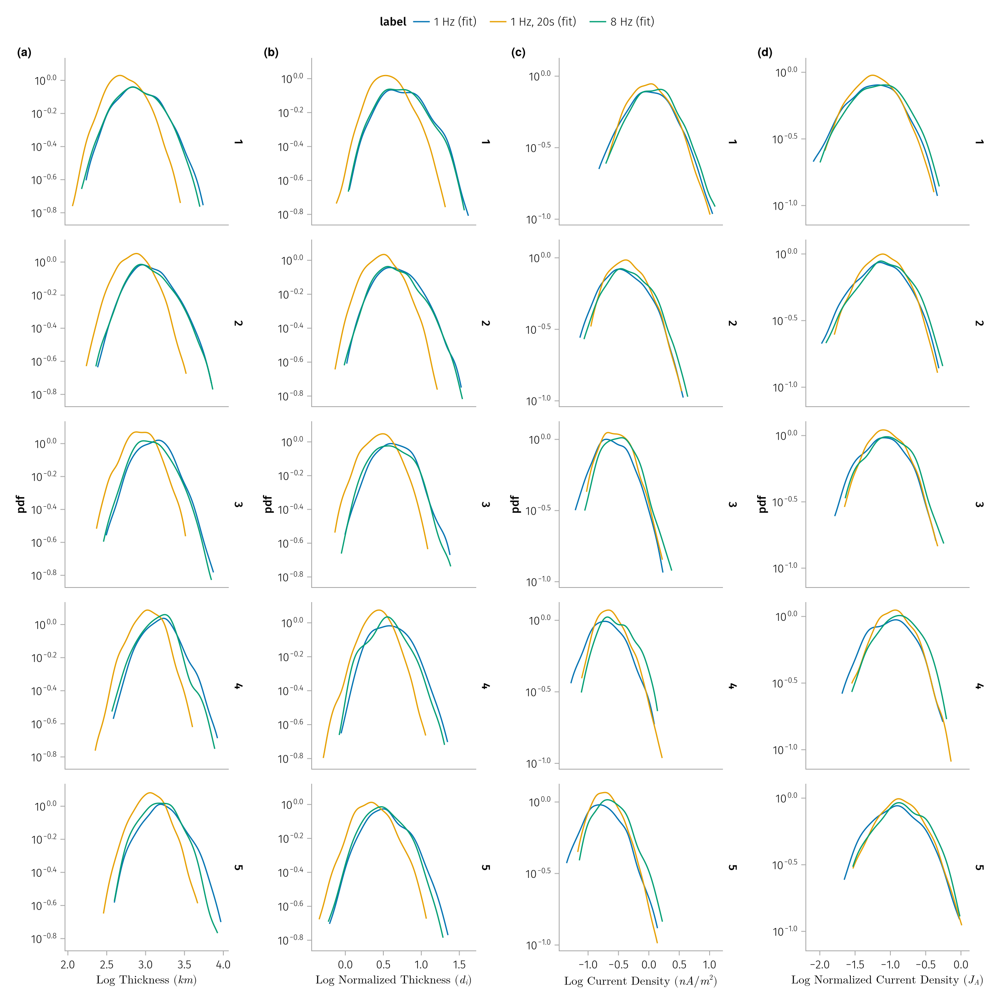

In [52]:
plot_l_j_r(j_events)

In [62]:
function plot_l_j_r_hist(
    df;
    maps=(l_map, l_norm_map, j_map, j_norm_map),
    f_maps=(row=:r, color=:label),
    normalization=:pdf,
    fig_options = (size = (1200, 1000),)
)
    fig = Figure(;fig_options)

    plt = data(df) * mapping(; f_maps...) * (visual(Lines) + visual(Scatter))
    plt *= histogram(datalimits=datalimits_f, normalization=normalization)

    plts = [plt * mapping(m) for m in maps]
    axis = (; yscale=log10)

    grids = [draw!(fig[1:5, i], p, axis=axis) for (i, p) in enumerate(plts)]
    legend!(fig[0, 1:end], grids[1], titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_j_r_hist (generic function with 1 method)

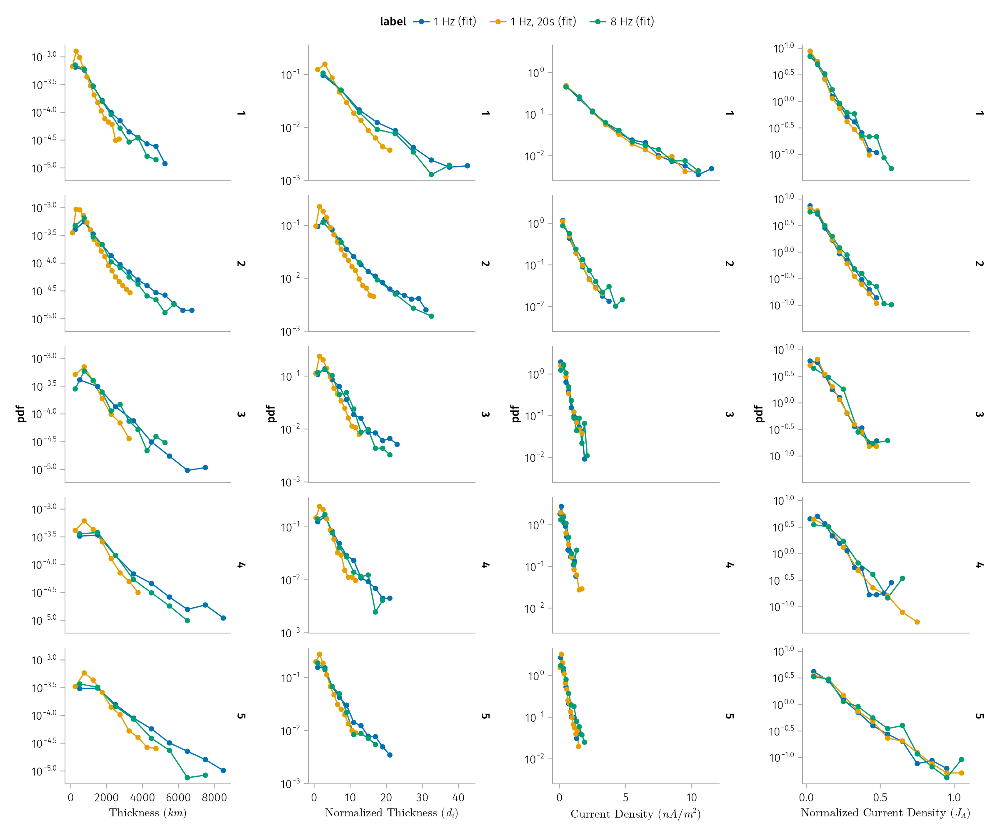

In [8]:
#| label: fig-l-j-r-fit
plot_l_j_r_hist(j_events)

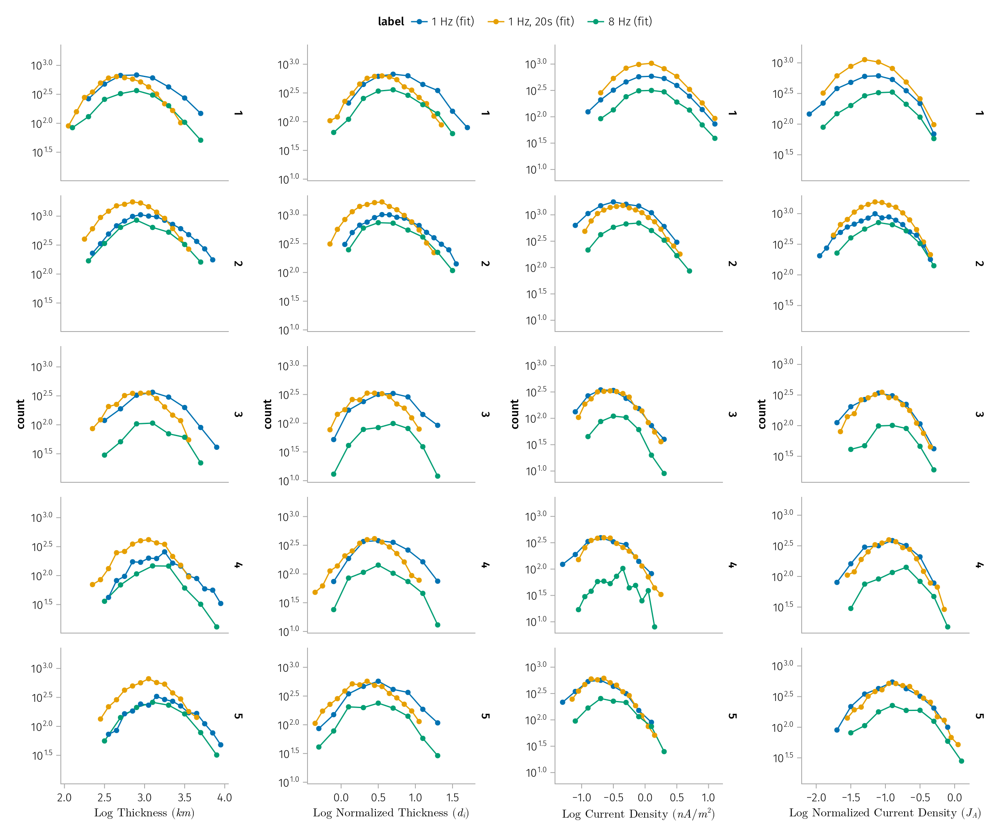

In [9]:
maps = (l_log_map, l_norm_log_map, j_log_map, j_norm_log_map)
plot_l_j_r_hist(j_events; maps = maps, normalization = :none)

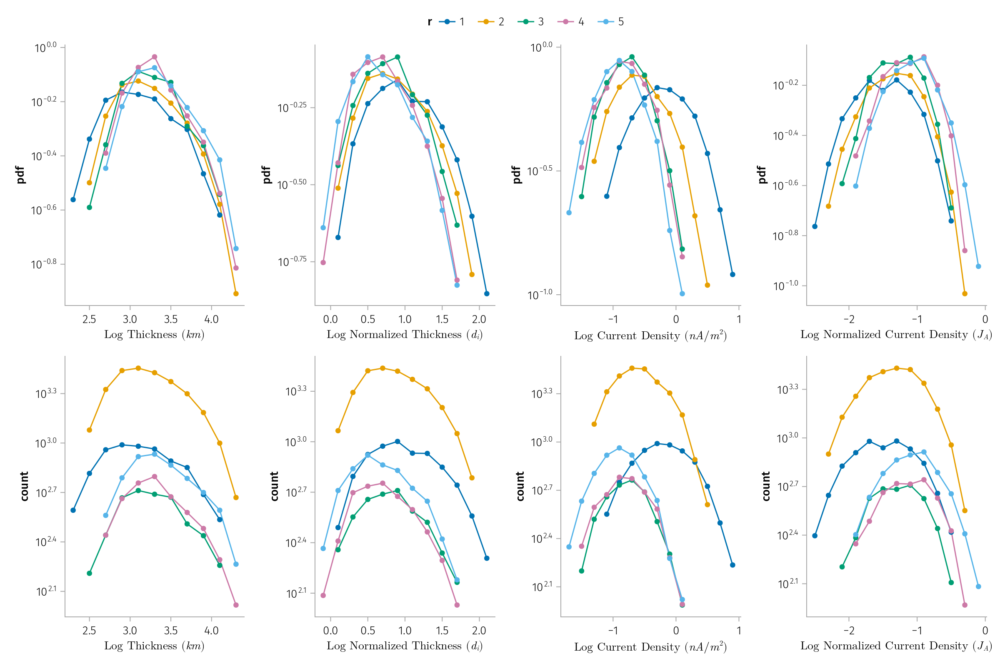

In [15]:
#| column: page
function plot_l_j_r_hist(
    df;
    maps=(l_map, l_norm_map, j_map, j_norm_map),
    f_maps = (color=:r,),
    size = (1200, 800),
)
    fig = Figure(size=size)
    axis = (; yscale=log10)

    plt = data(df) * mapping(; f_maps...) * (visual(Lines) + visual(Scatter))
    plt_h = plt * histogram(datalimits=datalimits_f, normalization=:pdf)
    plts = [plt_h * mapping(m) for m in maps]
    grids = [draw!(fig[1, i], p, axis=axis) for (i, p) in enumerate(plts)]


    plt_h = plt * histogram(datalimits=datalimits_f)
    plts = [plt_h * mapping(m) for m in maps]
    grids = [draw!(fig[2, i], p, axis=axis) for (i, p) in enumerate(plts)]
    legend!(fig[0, 1:end], grids[1], titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_j_r_hist(j_events_low_fit; maps=maps, f_maps=f_maps)

In [49]:
@rput j_events
@rput j_events_taus
@rput j_events_taus_u
@rput j_events_low_fit
@rput j_events_tau_20_fit


R"""
library(ggplot2)
library(ggpubr)
library(patchwork)
source('utils.R')
"""

RObject{VecSxp}
$value
function (df1, df2, p1title = p1title, y_lim_1 = c(500, 40000), 
    y_lim_2 = c(1, 200)) 
{
    x_col <- "radial_distance"
    x_bins <- 5
    y_bins <- 12
    add_mode <- TRUE
    y_col <- "L_k"
    y_lim <- y_lim_1
    ylab <- lab_l_log
    p <- plot_binned_data(df1, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p1 <- p + labs(x = NULL, y = ylab) + ggtitle(p1title)
    y_col <- "L_k_norm"
    y_lim <- y_lim_2
    ylab <- lab_l_norm_log
    p <- plot_binned_data(df1, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p2 <- p + labs(x = x_lab_r, y = ylab)
    x_col <- "time"
    y_col <- "L_k"
    y_lim <- y_lim_1
    p <- plot_binned_data(df2, x_col = x_col, y_col = y_col, 
        x_bins = x_bins, y_bins = y_bins, y_lim = y_lim, y_log = TRUE, 
        add_mode = add_mode)
    p3 <- p + la

In [ ]:
using RCall

In [10]:
#| output: false

R"""
density_plot <- function(df,
  x,
  density.y = "density",
  facet.by = "r",
  color = "label",
  strip.position = "top")
{
  p <- ggdensity(
    df, 
    x = x, y = density.y,
    color = color,
    facet.by = facet.by,
    add = "median",
    alpha = 0
  ) %>%
  facet(facet.by, ncol = 1, strip.position = strip.position)
}

plot <- function(
  df,
  d1_ulim = 8000,
  d2_ulim = 40,
  d3_ulim = 8,
  d4_ulim = 1.2,
  xscale = "none",
  yscale = "log10",
  p1_xlim = NULL,
  p1_ylim = NULL,
  p2_xlim = NULL,
  p2_ylim = NULL, # c(10^-3, 1)
  p3_xlim = NULL, p3_ylim = NULL,
  p4_xlim = NULL, p4_ylim = NULL,
  plot_func = density_plot,
  ...
) {

  p1 <- plot_func(
    filter(df, L_k < d1_ulim), "L_k", ...
  )
  
  p2 <- plot_func(
    filter(df, L_k_norm < d2_ulim), "L_k_norm", ...
  )
  
  p3 <- plot_func(
    filter(df, j0_k < d3_ulim), "j0_k", ...
  )
  
  p4 <- plot_func(
    filter(df, j0_k_norm < d4_ulim), "j0_k_norm", strip.position = "right", ...
  )

  p1 <- ggpar(p1,
      xscale=xscale, xlim = p1_xlim,
      yscale=yscale, ylim = p1_ylim
    ) + labs(x = lab_l)
  
  p2 <- ggpar(p2, 
      xscale=xscale, xlim = p2_xlim,
      yscale=yscale, ylim = p2_ylim, ylab=FALSE
    ) + labs(x = lab_l_norm)
  
  p3 <- ggpar(p3,
      xscale=xscale, xlim = p3_xlim,
      yscale=yscale, ylim = p3_ylim, ylab=FALSE
    ) + labs(x = lab_j)
  
  p4 <- ggpar(p4,
      xscale=xscale, xlim = p4_xlim,
      yscale=yscale, ylim = p4_ylim, ylab=FALSE
    ) + labs(x = lab_j_norm)
  
  tag_pool <- unique(df$r)
  
  p1 <- tag_facet(p1, open = "(a.", tag_pool = tag_pool)
  p2 <- tag_facet(p2, open = "(b.", tag_pool = tag_pool)
  p3 <- tag_facet(p3, open = "(c.", tag_pool = tag_pool)
  p4 <- tag_facet(p4, open = "(d.", tag_pool = tag_pool) + theme(
    strip.background = element_blank(),
    strip.text.x = element_blank()
  )

  p <- p1 + p2 + p3 + p4
  p <- p + plot_layout(nrow = 1, guides = "collect") & theme(legend.position='top')  
}
"""

RObject{ClosSxp}
function (df, d1_ulim = 8000, d2_ulim = 40, d3_ulim = 8, d4_ulim = 1.2, 
    xscale = "none", yscale = "log10", p1_xlim = NULL, p1_ylim = NULL, 
    p2_xlim = NULL, p2_ylim = NULL, p3_xlim = NULL, p3_ylim = NULL, 
    p4_xlim = NULL, p4_ylim = NULL, plot_func = density_plot, 
    ...) 
{
    p1 <- plot_func(filter(df, L_k < d1_ulim), "L_k", ...)
    p2 <- plot_func(filter(df, L_k_norm < d2_ulim), "L_k_norm", 
        ...)
    p3 <- plot_func(filter(df, j0_k < d3_ulim), "j0_k", ...)
    p4 <- plot_func(filter(df, j0_k_norm < d4_ulim), "j0_k_norm", 
        strip.position = "right", ...)
    p1 <- ggpar(p1, xscale = xscale, xlim = p1_xlim, yscale = yscale, 
        ylim = p1_ylim) + labs(x = lab_l)
    p2 <- ggpar(p2, xscale = xscale, xlim = p2_xlim, yscale = yscale, 
        ylim = p2_ylim, ylab = FALSE) + labs(x = lab_l_norm)
    p3 <- ggpar(p3, xscale = xscale, xlim = p3_xlim, yscale = yscale, 
        ylim = p3_ylim, ylab = FALSE) + labs(x = lab_j)
    p4 <- ggpar(p4

### Properties over radial distance with different `tau` values

In [36]:
#| output: false
R"""
plot(
    j_events_taus,
    d1_ulim = Inf, p1_xlim = c(0,1e4), p1_ylim = c(1e-5, 1e-3),
    d2_ulim = 25, p2_xlim = c(0,25), p2_ylim = c(1e-2, 1e0),
    d3_ulim = 20, p3_xlim = c(0,8), p3_ylim = c(1e-2, 1e0),
    d4_ulim = 2, p4_xlim = c(0, 1), p4_ylim =  c(1e-1, 1e1),
)

save_plot("l_j_fit_taus", width = 15, height = 5)


plot(
    j_events_taus,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    d4_ulim = Inf, p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
)

save_plot("l_j_fit_taus_xscale_log", width = 15, height = 5)
"""

┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 tran

RObject{StrSxp}
../figures/l_j_fit_taus.pdf


In [61]:
#| output: false
R"""
plot(
    j_events_taus_u,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    d4_ulim = Inf, p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
    facet.by = NULL, color = "r"
)

save_plot("l_j_fit_xscale_log", width = 15, height = 5)

plot(
    j_events_taus_u,
    d1_ulim = Inf, p1_xlim = c(0, 1e4), p1_ylim = c(1e-5, 1e-3),
    d2_ulim = Inf, p2_xlim = c(0, 25), p2_ylim = c(1e-2, 1e0),
    d3_ulim = 20, p3_xlim = c(0,8), p3_ylim = c(1e-2, 1e0),
    d4_ulim = 2, p4_xlim = c(0, 1), p4_ylim =  c(1e-1, 1e1),
    facet.by = NULL, color = "r",
)

save_plot("l_j_fit", width = 15, height = 5)
"""

┌ Warning: RCall.jl: Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in log(x, base) : NaNs produced
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning: Removed 1 row containing missing values or values outside the scale range
│ (`geom_text()`).
│ Warning in log(x, base) : NaNs produced
│ Warning in scale_y_continuous(trans = yscale) :
│   log-10 transformation introduced infinite values.
│ Warning: Removed 1 row containing missing values or values outside the scale range


RObject{StrSxp}
../figures/l_j_fit.pdf


[l_j_fit](../figures/l_j_fit.png)

[l_j_fit_xscale_log](../figures/l_j_fit_xscale_log.png)

[l_j_fit_xscale_log_count](../figures/l_j_fit_xscale_log_count.png)


[l_j_fit_taus](../figures/l_j_fit_taus.png)

[l_j_fit_taus_xscale_log](../figures/l_j_fit_taus_xscale_log.png)

#### Check the effect of time resolution and time window

In [203]:
#| output: false
R"""
# plot(j_events_der)
# save_plot("l_j_r_der", width = 15, height = 10)
# plot(
#     j_events,
#     p1_ylim = c(1e-5, 1e-3),
# )
# save_plot("l_j_r_fit", width = 15, height = 10)

plot(
    j_events,
    xscale = "log10",
    d1_ulim = Inf, p1_xlim = c(1e2, 1e5), p1_ylim = c(1e-2, 1e0),
    d2_ulim = Inf, p2_xlim = c(1e-1, 1e2), p2_ylim = c(1e-2, 1e0),
    d3_ulim = Inf, p3_xlim = c(1e-2, 5e1), p3_ylim = c(1e-2, 1e0),
    p4_xlim = c(1e-3, 5e0), p4_ylim = c(1e-2, 1e0),
)
save_plot("l_j_r_fit_xscale_log", width = 15, height = 10)
"""

┌ Warning: RCall.jl: Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Transformation introduced infinite values in continuous y-axis
└ @ RCall /Users/zijin/.julia/packages/RCall/dDAVd/src/io.jl:172
┌ Warning: RCall.jl: Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in self$trans$transform(x) : NaNs produced
│ Warning: Transformation introduced infinite values in continuous y-axis
│ Warning: Removed 5 rows containing missing values (`geom_text()`).
│ Warning in 

RObject{StrSxp}
../figures/l_j_r_fit_xscale_log.pdf


[l_j_r_fit](../figures/l_j_r_fit.png)

[l_j_r_der](../figures/l_j_r_der.png)

[l_j_r_fit_xscale_log](../figures/l_j_r_fit_xscale_log.png)

### Plot the median of discontinuity properties with radial distance

In [47]:
function q25(x)
    quantile(x, 0.25)
end

function q75(x)
    quantile(x, 0.75)
end

function stat_info(df; group_cols = [:r, :label])
    cols = [:L_k, :L_k_norm, :j0_k, :j0_k_norm]
    funcs = [median mean std q25 q75]
    
    @chain df begin
        groupby(group_cols)
        combine(cols .=> funcs)
    end
end

stat_info (generic function with 1 method)

In [68]:
### Plot the median of discontinuity properties with radial distance
function plot_median_r(df; add_error=false)
    df_m = stat_info(df)

    fig = Figure()
    plt = data(df_m) * mapping(:r => r_lab, color=:label)

    mappings = [
        ("L_k", l_lab),
        ("L_k_norm", l_norm_lab),
        ("j0_k", j_lab),
        ("j0_k_norm", j_norm_lab)
    ]

    function plt_map(plt, col, label)
        plt *= mapping("$(col)_median" => label)
        lines_map = (visual(Lines) + visual(Scatter))
        errorbars_map = mapping("$(col)_q25", "$(col)_q75") * visual(Errorbars, alpha=0.1, whiskerwidth=10)

        maps = [lines_map]
        add_error && push!(maps, errorbars_map)
        
        plt * reduce(+, maps)
    end

    plts = [plt_map(plt, col, label) for (col, label) in mappings]
    popositions = [(1, 1), (1, 2), (2, 1), (2, 2)] # Define grid positions
    grids = [draw!(fig[pos...], plt) for (pos, plt) in zip(popositions, plts)]
    pretty_legend!(fig, grids[1])

    fig
end

plot_median_r (generic function with 3 methods)

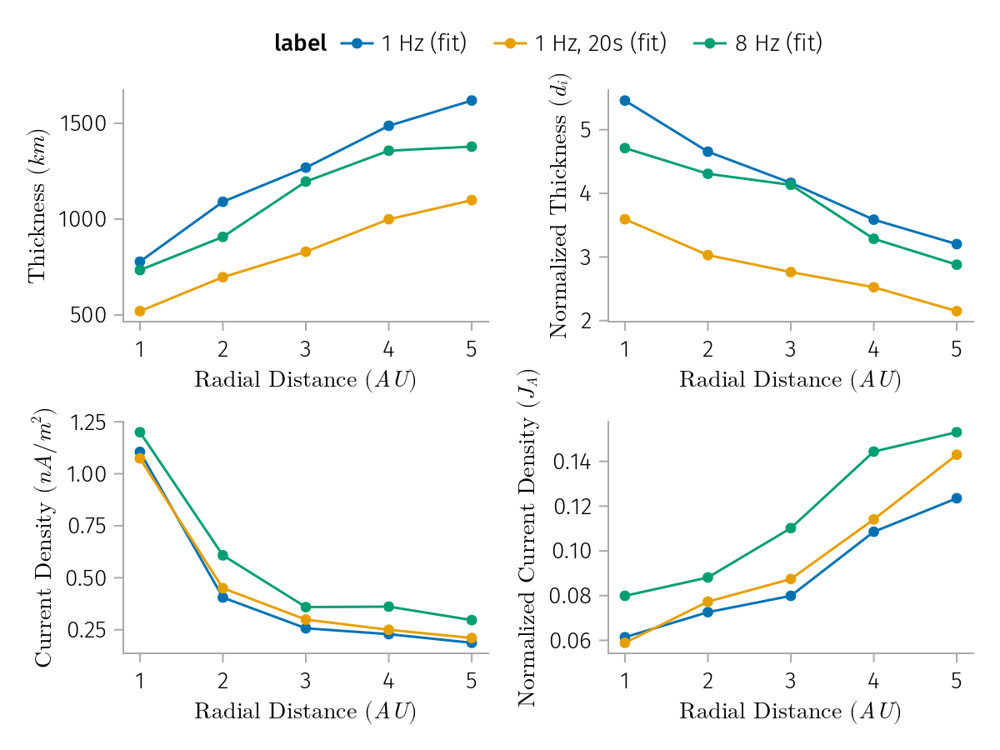

In [92]:
plot_median_r(j_events)

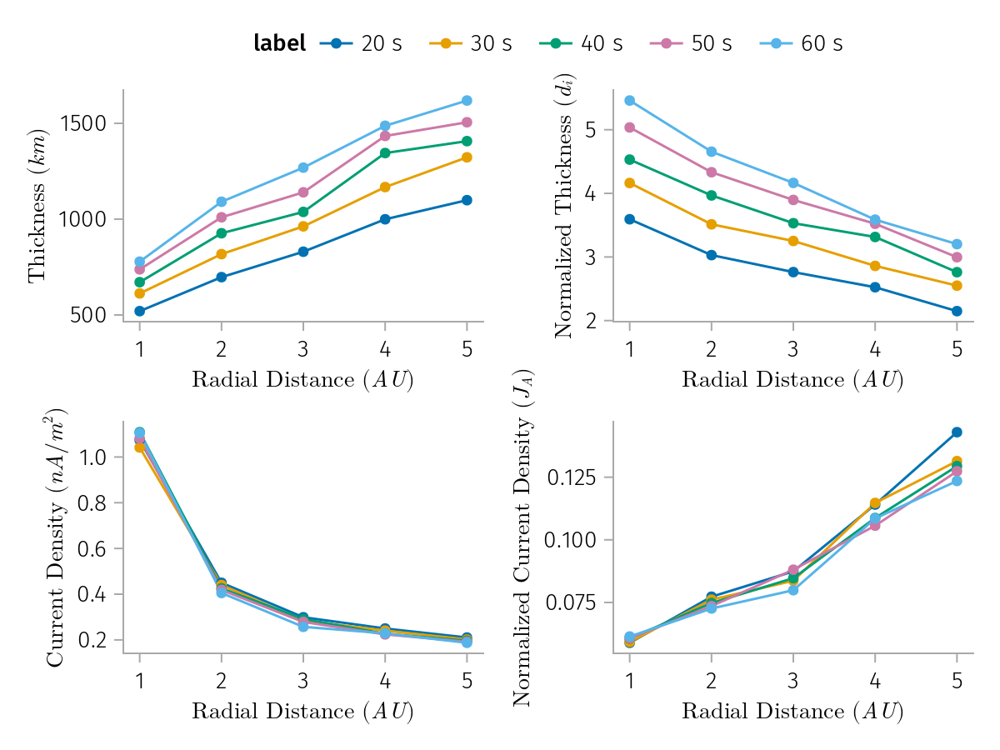

In [91]:
plot_median_r(j_events_taus)

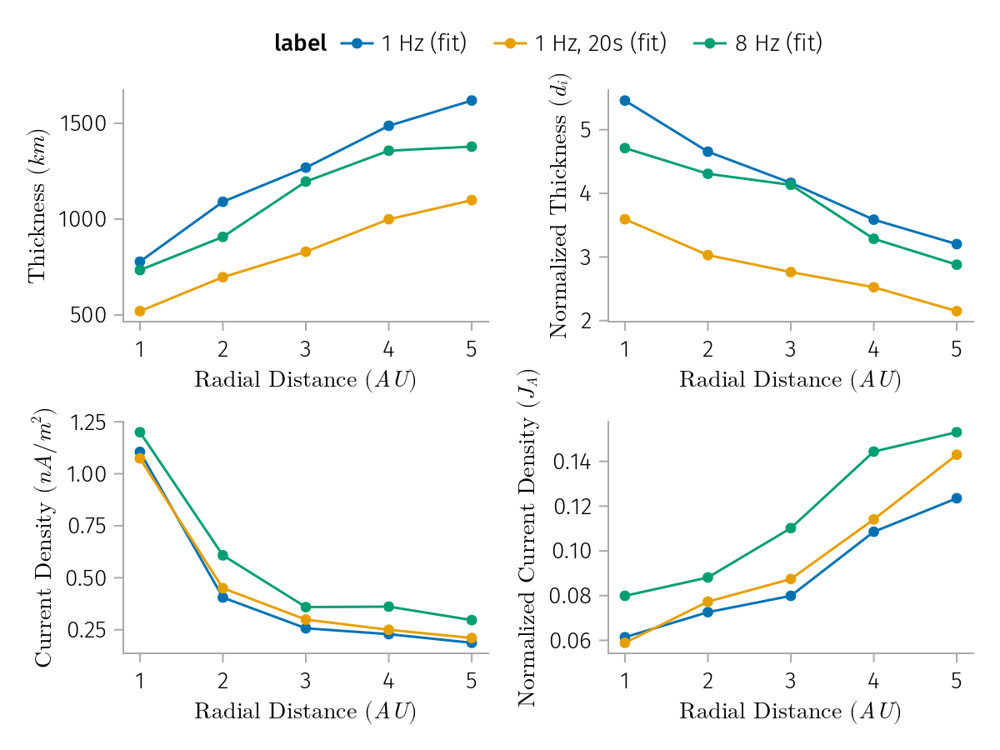

In [82]:
plot_median_r(j_events)

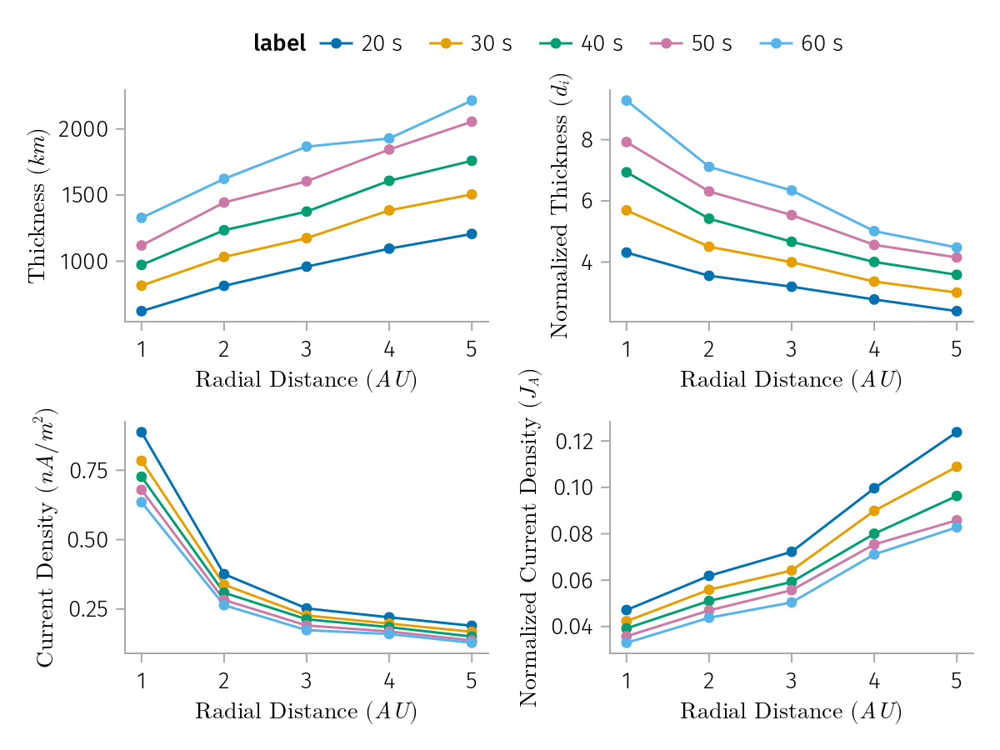

In [81]:
plot_median_r(j_events_taus)

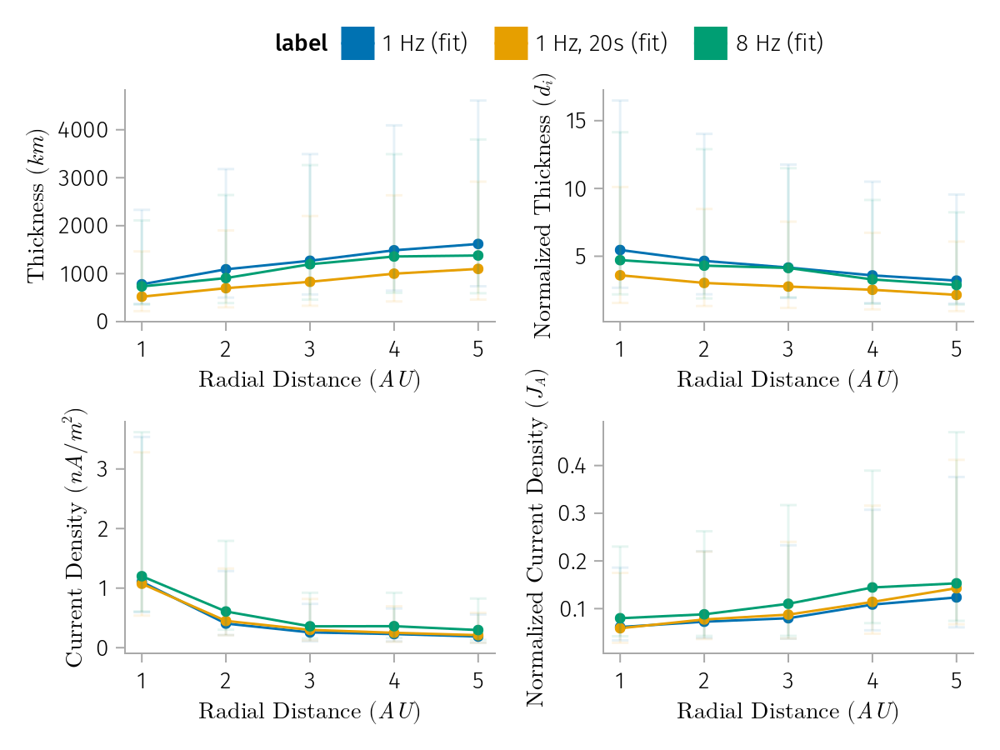

In [124]:
plot_median_r(j_events; add_error=true)

### Plot different radial distances in the same plot

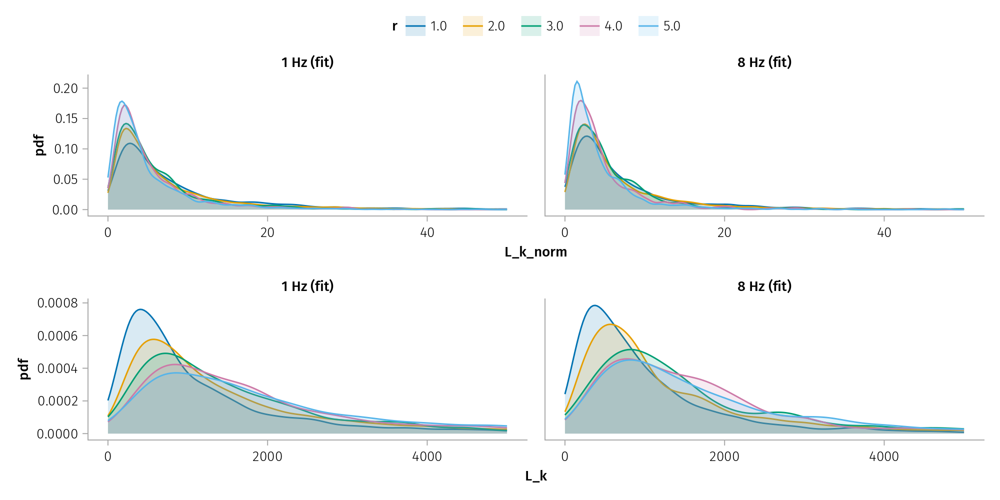

In [54]:
#| label: fig-l-r-fit
function plot_l_r_one(df)
    fig = Figure(size=(1000, 500))

    plt = data(df) * mapping(col=:label, color=:r)
    
    grid1 = draw!( fig[1, 1:2], plt * mapping(:L_k_norm) * density(datalimits=((0, 50),)) )
    grid2 = draw!( fig[2, 1:2], plt * mapping(:L_k) * density(datalimits=((0, 5000),)) )
    legend!(fig[0, 1:end], grid1, titleposition=:left, orientation=:horizontal)

    fig
end

plot_l_r_one(j_events)

## Plasma properties with radial distance

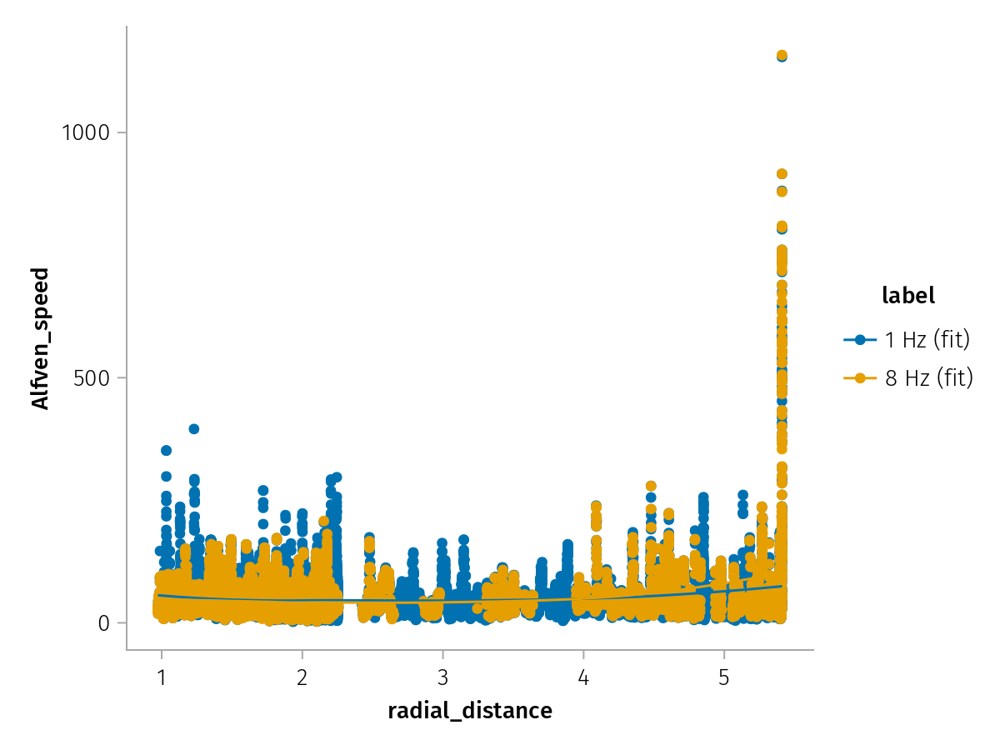

In [66]:
plt = data(j_events) * mapping(:radial_distance, :Alfven_speed, color=:label) * (visual(Scatter) + smooth())
plt |> draw

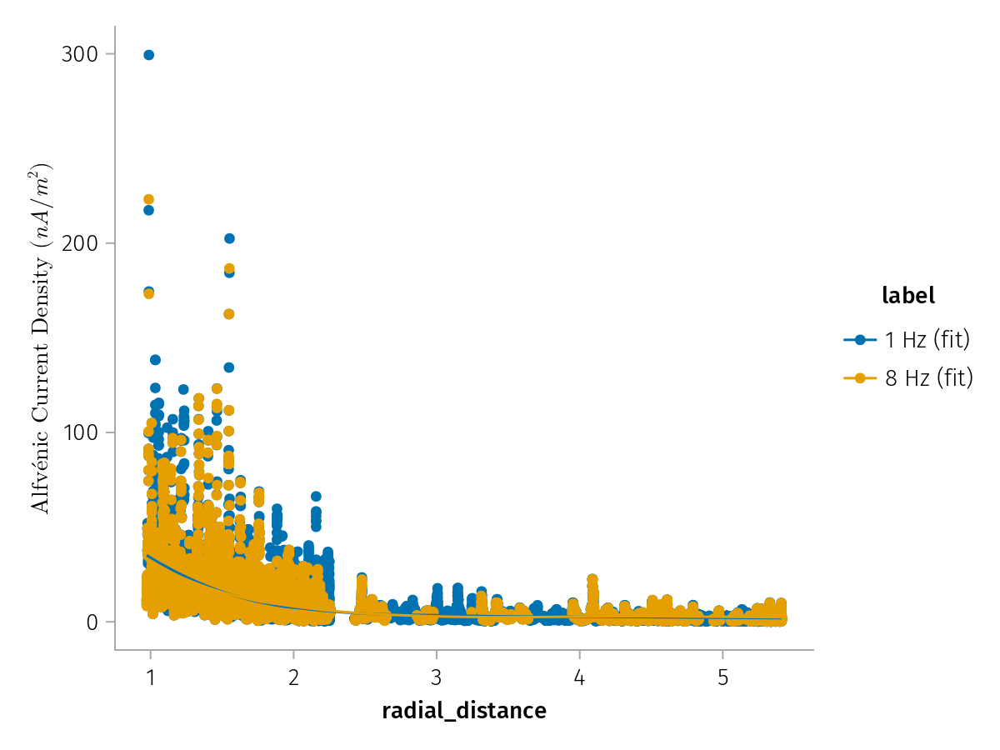

In [64]:
plt = data(j_events) * mapping(:radial_distance, jA_map, color=:label) * (visual(Scatter) + smooth())
plt |> draw

In [79]:
using Statistics

In [86]:
# groupby r and describe the data for each group 
# j_events |> @groupby(_.r) |> @map({r=key(_), j0_k=describe(_.j0_k), L_k=describe(_.L_k)})
@chain j_events begin
    groupby(:r)
    combine(:plasma_density =>  mean, :ion_inertial_length => mean, :b_mag => mean) 
end

Row,r,plasma_density_mean,ion_inertial_length_mean,b_mag_mean
,String,Float64,Float64,Float64
1,1.0,3.10512,152.217,3.75957
2,2.0,1.42267,242.722,2.10041
3,3.0,0.674452,317.706,1.45649
4,4.0,0.417696,434.665,1.3097
5,5.0,0.343857,569.222,1.27077


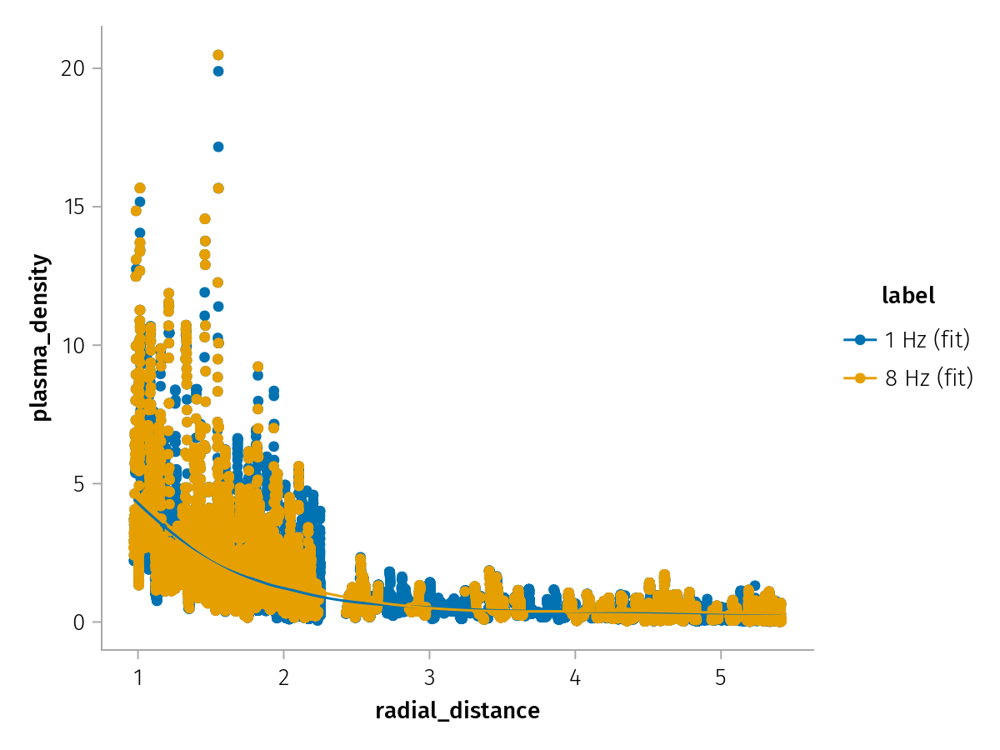

In [67]:
plt = data(j_events) * mapping(:radial_distance, :plasma_density, color=:label) * (visual(Scatter) + smooth())
plt |> draw

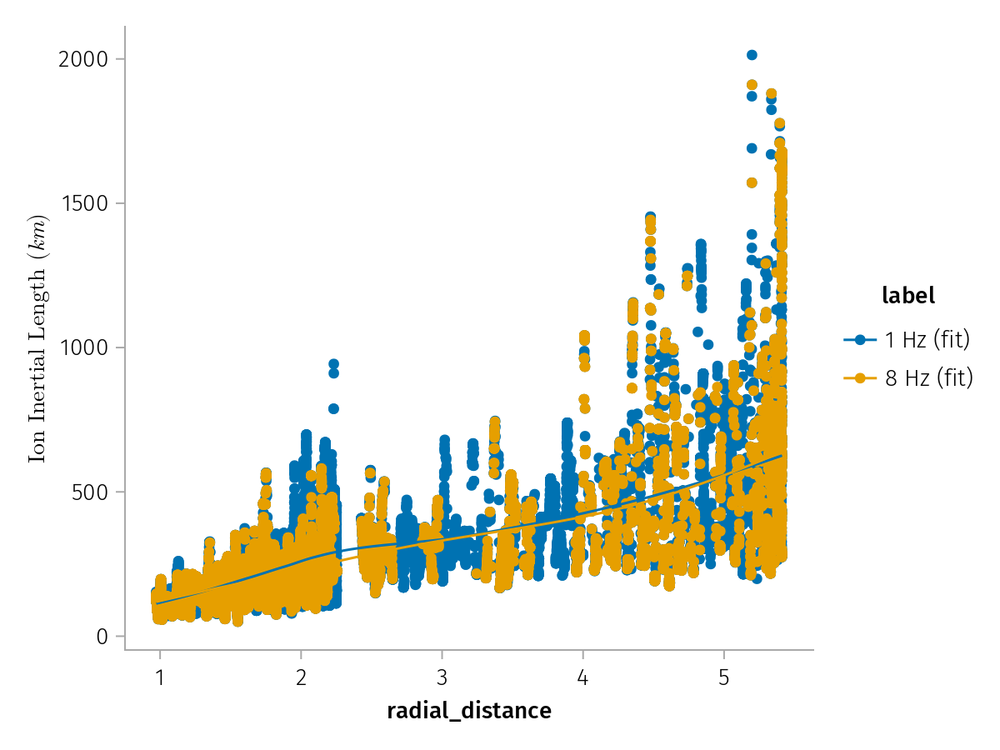

In [65]:
plt = data(j_events) * mapping(:radial_distance, di_map, color=:label) * (visual(Scatter) + smooth())
plt |> draw

## Check discontinuities properties in relation to the local plasma properties

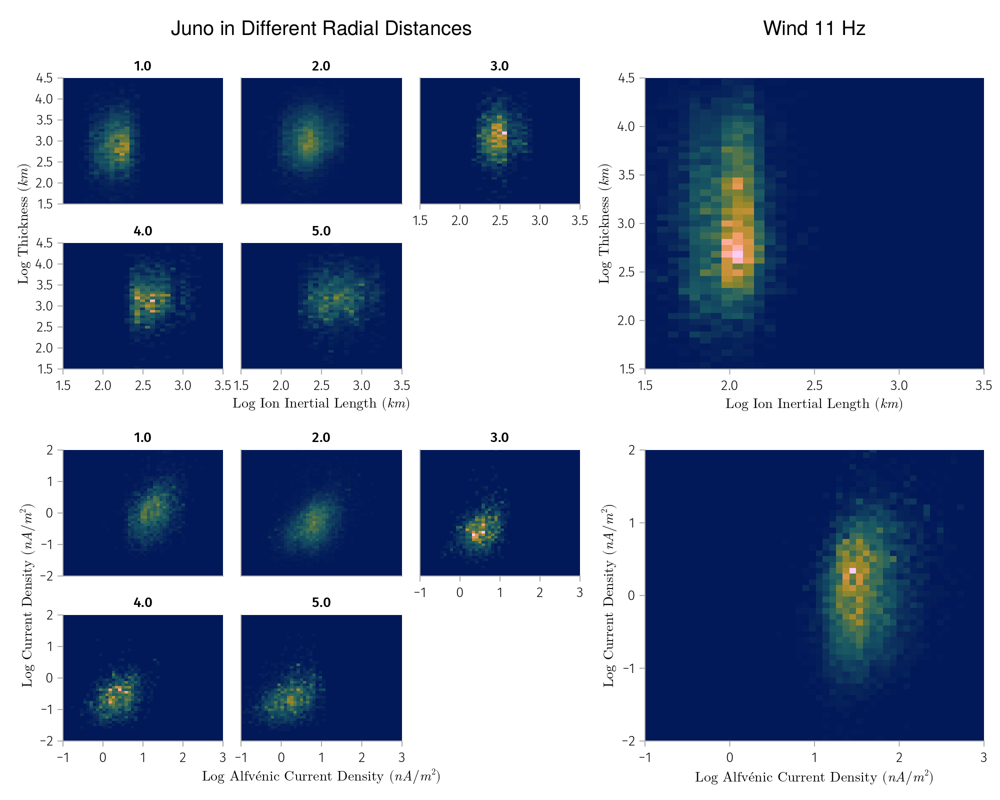

In [ ]:
#| label: fig-local-comp-map
#| column: page
begin
    fig = Figure(size=(1000, 800))

    datalayer = mapping() * visual(Scatter, markersize=1, color=:white, alpha=0.1)

    begin
        layer = histogram(bins=range(1, 5, length=64), normalization=:pdf)
        plt = layer * mapping(di_log_map, l_log_map)
        plt1 = data(j_events) * mapping(layout=:r) * plt
        plt2 = data(wind_df) * plt
    
        l_log_limit = ((1.5, 3.5), (1.5, 4.5))
        axis = (;limits=l_log_limit)
        draw!(fig[1:2,1:3], plt1, axis=axis)
        draw!(fig[1:2,4:5], plt2, axis=axis) 
    end

    # Current Density Panels
    begin
        layer = histogram(bins=range(-2, 3, length=64), normalization=:pdf)
        plt = layer * mapping(jA_log_map, j_log_map)
        plt3 = data(j_events) * mapping(layout=:r) * plt
        plt4 = data(wind_df) * plt
    
        j_log_limit = ((-1, 3), (-2, 2))
        axis = (;limits=j_log_limit)
        draw!(fig[3:4,1:3], plt3, axis=axis)
        draw!(fig[3:4,4:5], plt4, axis=axis)
    end

    # Make ablines across different r panels
    # begin
        # ablines_data = (; intercepts=[-3,-1,1], slopes=[1,1,1]) 
        # lines = data(ablines_data) * mapping(:intercepts, :slopes) * visual(ABLines, linestyle=:dash)
        # draw!(fig[3:4,1:3], lines)
    # end

    Label(fig[0,1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0,4:5], "Wind 11 Hz", fontsize=20)

    fig
end

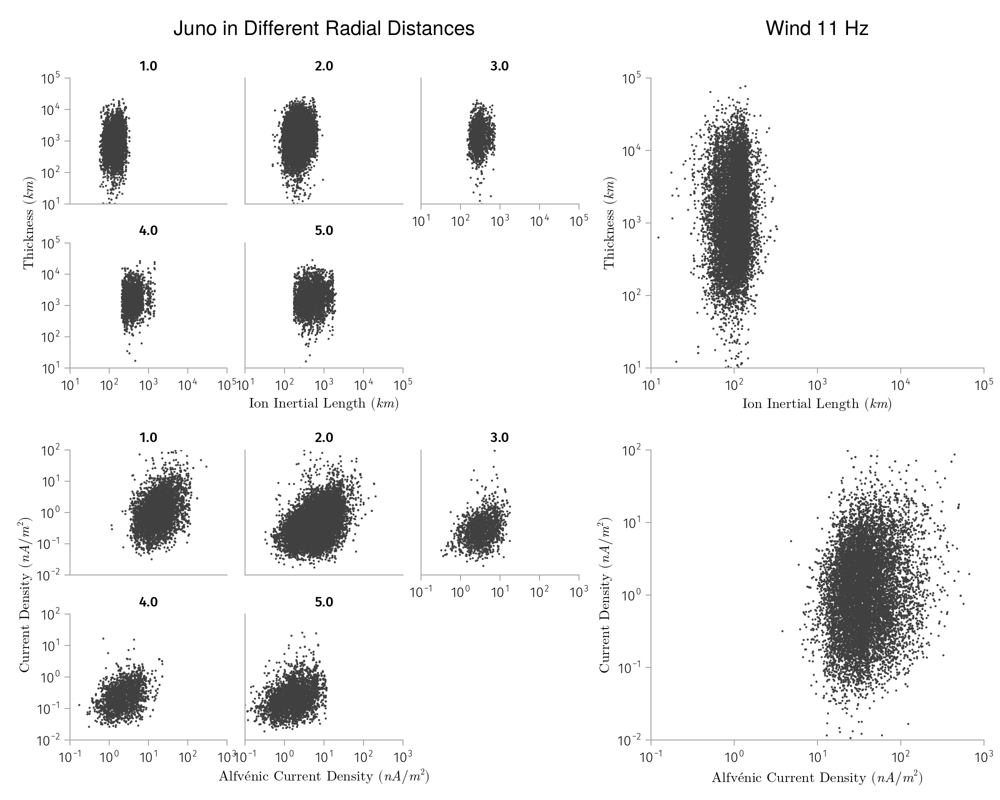

In [ ]:
#| label: fig-l-comp
begin
    fig = Figure(size=(1000, 800))

    pdflayer = density() * visual(Contour)
    # small scatter points
    datalayer = mapping() * visual(Scatter, markersize=3)

    # layer = pdflayer + datalayer
    layer = datalayer
    plt = layer * mapping(di_map, l_map)
    plt1 = data(j_events) * mapping(layout=:r) * plt
    plt2 = data(wind_df) * plt

    l_limit = ((10^1, 10^5), (10^1, 10^5))
    axis = merge(log_axis, (;limits=l_limit))
    draw!(fig[1:2,1:3], plt1, axis=axis)
    draw!(fig[1:2,4:5], plt2, axis=axis)

    plt = layer * mapping(jA_map, j_map)
    plt3 = data(j_events) * mapping(layout=:r) * plt
    plt4 = data(wind_df) * plt

    j_limit = ((10^-1, 10^3), (10^-2, 10^2))
    axis = merge(log_axis, (;limits=j_limit))
    draw!(fig[3:4,1:3], plt3, axis=axis)
    draw!(fig[3:4,4:5], plt4, axis=axis)


    Label(fig[0,1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0,4:5], "Wind 11 Hz", fontsize=20)

    fig
end

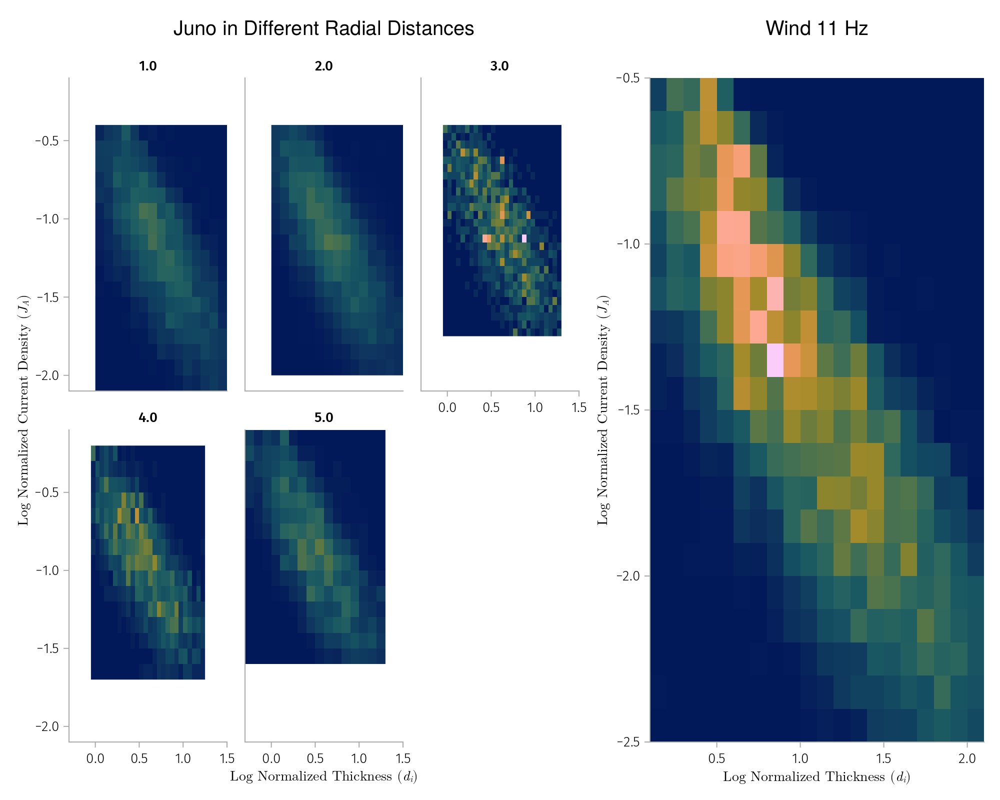

In [ ]:
begin
    fig = Figure(size=(1000, 800))
    datalimits_f = x -> quantile(x, [0.05, 0.95])

    begin
        layer = histogram(bins=24, datalimits=datalimits_f, normalization=:pdf)
        plt = layer * mapping(l_norm_log_map, j_norm_log_map)
        plt1 = data(j_events) * mapping(layout=:r) * plt
        plt2 = data(wind_df) * plt

        axis = (;)
        draw!(fig[1:2, 1:3], plt1, axis=axis)
        draw!(fig[1:2, 4:5], plt2, axis=axis)
    end

    Label(fig[0, 1:3], "Juno in Different Radial Distances", fontsize=20)
    Label(fig[0, 4:5], "Wind 11 Hz", fontsize=20)

    fig
end

fig

## Derivative method validation

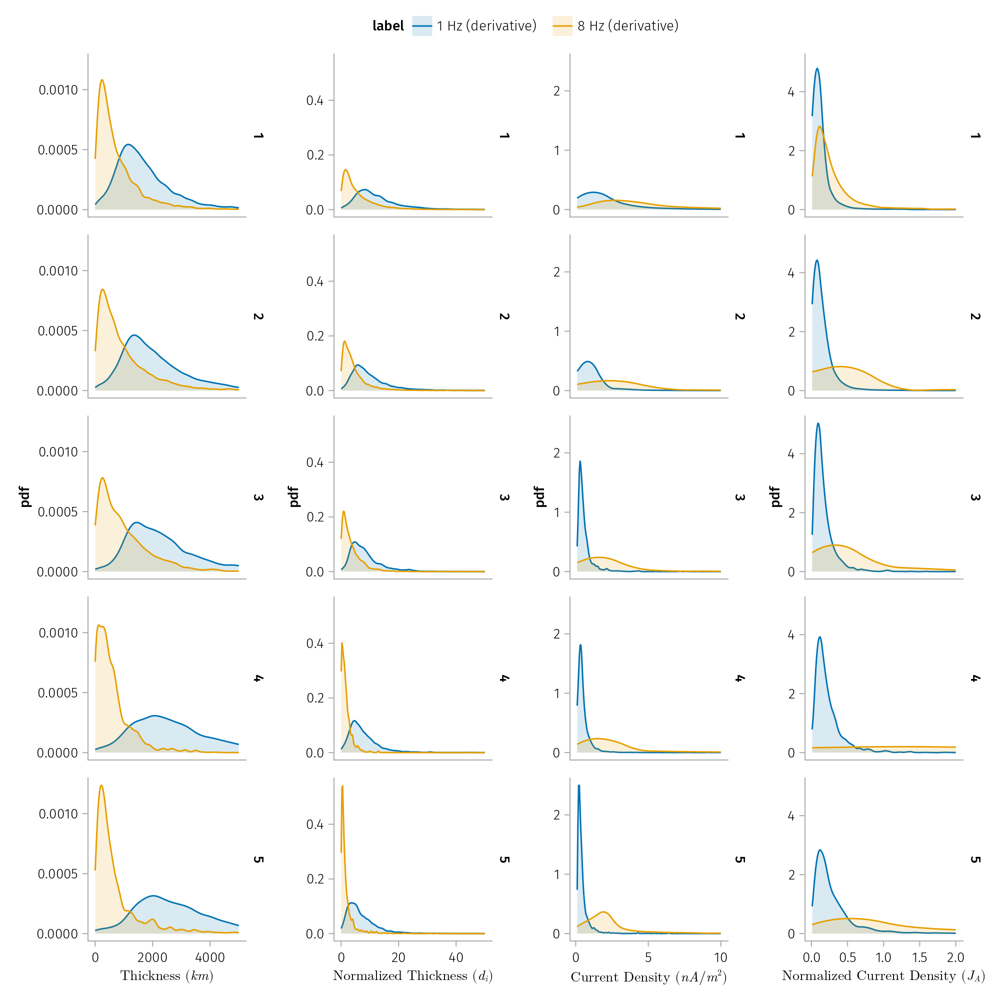

In [16]:
#| label: fig-l-j-r-der

fig = plot_l_j_r(j_events_der)
fig